# **ES114 Probability Lab Assignment 6 - Image Binarization using Otsu's Threshold**
###&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**By Karan Sagar Gandhi (23110157)**

In this assignment, I have implemented Otsu's Thresholding algorithm. I run the algorithm on the provided images in the first part of the notebook. In the later part of the notebook, I add Gaussian Noise to the given images, with different variances, and apply the same Otsu's thresholding algorithm, to observe different results.

## Importing libraries

In [ ]:
from matplotlib import pyplot as plt
import cv2
import numpy as np
import math
import random
from google.colab import output # To disable scrolling in the cells

## General Utility functions

Here I define general functions which will be used to read, display and save images and histograms. I have defined the following functions:

* **DisplayImages:** This function will display the given array of images in a single line.
* **GetImagePixelValues:** This function will read and return a 2D array containing the pixel intensity values of the image.
* **PlotHistograms:** This will plot the PDF and the CDF of multiple images in a single line
* **SaveImage:** This will save the image with the given file name
* **CalculateHistogram:** This will calculate the pixel intensity histogram for the given image.
* **BinarizeImage:** This will create a new image, whose pixel values is either 0 or 255 only. The given pixel value will be 0 if the value of the current pixel in the original image is less than or equal to the threshold value $t$ and 255 otherwise.

In [ ]:
def DisplayImages(images, titles=None, title=""): # This will display images in a line
  fig, ax = plt.subplots(1, len(images), figsize=(len(images) * 6, 6))
  for i, image in enumerate(images):
    ax[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax[i].axis('off')
    if not titles is None:
      ax[i].set_title(titles[i])

  if len(title) != 0:
    fig.suptitle(title, fontsize='xx-large')

  fig.show()

def GetImagePixelValues(image_name): # This will read and return the image values
  return cv2.imread(image_name, 0)

def PlotHistograms(histogram, titles): # This plots the given histogram
  n = len(histogram)
  fig, ax = plt.subplots(1, n, figsize=(n * 5, 5))
  for i in range(n):
    cdf = histogram[i].cumsum()
    ax[i].bar(np.arange(256), histogram[i] / cdf[-1])
    tax = ax[i].twinx()
    tax.plot(np.arange(256), cdf / cdf[-1], color='r')
    tax.set_ylabel('CDF')
    ax[i].set_ylabel('PDF')
    ax[i].set_xlabel('Pixel Intensity')
    ax[i].set_title(titles[i])

  fig.tight_layout()
  fig.show()

def SaveImage(image, filename): # This will save the image with the given file name
  cv2.imwrite(filename, image)

def CalculateHistogram(image):
  freq = np.zeros(256)

  for i in image:
    for j in i:
      freq[j] += 1

  return freq

def BinarizeImage(image, t, display_image_and_histogram=False):
  new_image = np.zeros_like(image)

  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      if image[i, j] <= t:
        new_image[i, j] = 0
      else:
        new_image[i, j] = 255


  if display_image_and_histogram:
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax[0].axis('off')
    ax[0].set_title("Original Image")

    ax[1].imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))
    ax[1].axis('off')
    ax[1].set_title("Binarized Image")

    histogram = CalculateHistogram(image)


    cdf = histogram.cumsum()
    ax[2].bar(np.arange(256), histogram / cdf[-1], label='Intensity distribution')
    ax[2].axvline(x=t, color='g', label='Optimal t')
    tax = ax[2].twinx()
    tax.plot(np.arange(256), cdf / cdf[-1], color='r')
    tax.set_ylabel('CDF')
    ax[2].set_ylabel('PDF')
    ax[2].set_xlabel('Pixel Intensity')
    ax[2].set_title('Image Histogram')

    ax[2].legend()

    fig.tight_layout()
    fig.show()

  return new_image

## Functions to find the intraclass and interclass variance

Here I have defined a function to calculate the intraclass variance and the interclass variance after dividing the given pixel intensity values into two different sets based on the provided $t$.

In [ ]:
def InterClassVariance(histogram, t):
  N_pixels = histogram.sum()

  c1 = 0.0
  c2 = 0.0

  for i in range(len(histogram)):
    if i <= t:
      c1 += histogram[i]
    else:
      c2 += histogram[i]

  w1 = c1 / N_pixels
  w2 = c2 / N_pixels
  mu1 = 0
  mu2 = 0

  for i in range(len(histogram)):
    if i <= t:
      mu1 += i * histogram[i]
    else:
      mu2 += i * histogram[i]

  mu1 /= c1
  mu2 /= c2

  return w1 * w2 * ((mu1 - mu2) ** 2)


def IntraClassVariance(histogram, t):
  N_pixels = histogram.sum()

  c1 = 0.0
  c2 = 0.0

  for i in range(len(histogram)):
    if i <= t:
      c1 += histogram[i]
    else:
      c2 += histogram[i]

  w1 = c1 / N_pixels
  w2 = c2 / N_pixels
  mu1 = 0
  mu2 = 0

  for i in range(len(histogram)):
    if i <= t:
      mu1 += i * histogram[i]
    else:
      mu2 += i * histogram[i]

  mu1 /= c1
  mu2 /= c2

  var1 = 0
  var2 = 0

  for i in range(len(histogram)):
    if i <= t:
      var1 += ((i - mu1) ** 2) * histogram[i]
    else:
      var2 += ((i - mu2) ** 2) * histogram[i]

  var1 /= c1
  var2 /= c2

  return w1 * var1 + w2 * var2

## Reading and Displaying the images

In this section I read and display the image along with their pixel intensity distributions.

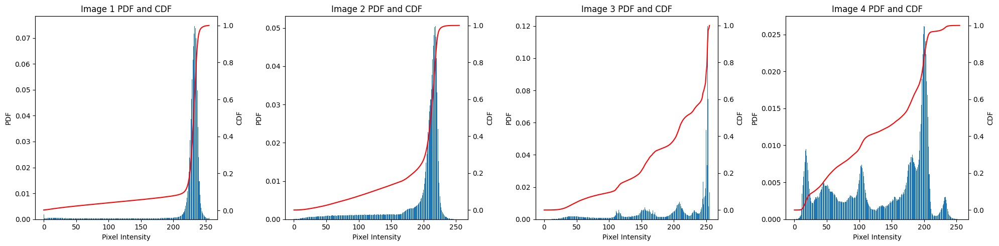

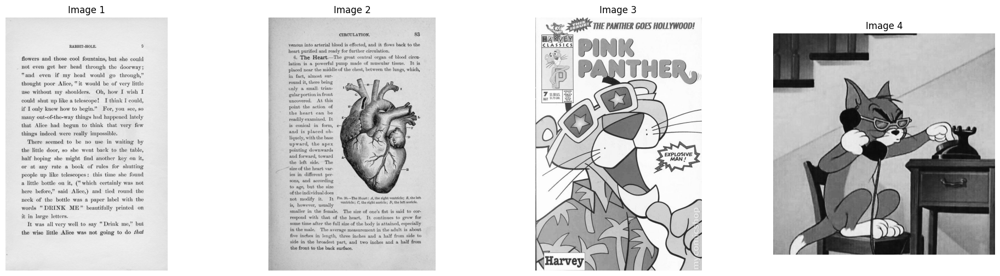

In [ ]:
img1 = GetImagePixelValues("bookpage_1.jpeg")
img2 = GetImagePixelValues("bookpage_2.jpeg")
img3 = GetImagePixelValues("panther.jpeg")
img4 = GetImagePixelValues("tom.jpeg")

histogram1 = CalculateHistogram(img1)
histogram2 = CalculateHistogram(img2)
histogram3 = CalculateHistogram(img3)
histogram4 = CalculateHistogram(img4)

PlotHistograms([histogram1, histogram2, histogram3, histogram4], ["Image 1 PDF and CDF", "Image 2 PDF and CDF", "Image 3 PDF and CDF", "Image 4 PDF and CDF"])
DisplayImages([img1, img2, img3, img4], ["Image 1", "Image 2", "Image 3", "Image 4"])

## Otsu's thresholding using interclass variance

In this section I implement Otsu's thresholding using inter class variance. We would choose a $t$ such that the interclass variance is maximised. So we can do that by simply running a for loop to find the optimal $t$ such that the inter class variance is maximised.

The expression for the interclass variance is:

$$w_1 \cdot w_2 \cdot (\mu_1 - \mu_2) ^ 2$$

Where,

$$w_1 = \sum_{i=0}^{t} p(i)$$

$$w_2 = \sum_{i=t + 1}^{L - 1} p(i)$$

$$\mu_1 = \frac{\sum_{i = 0}^{t} \ i \cdot p(i)}{w_1}$$

$$\mu_2 = \frac{\sum_{i = t + 1}^{L - 1} \ i \cdot p(i)}{w_2}$$

In [ ]:
def InterClassOptT(histogram):
  t_opt = 0
  opt_value = InterClassVariance(histogram, t_opt)
  last_non_zero = 0
  for i in range(256):
    if histogram[i] != 0:
      last_non_zero = i
  for i in range(256):
    if histogram[i] != 0:
      first_non_zero = i
      break

  for i in range(first_non_zero, last_non_zero):
    current = InterClassVariance(histogram, i)
    if opt_value < current:
      t_opt = i
      opt_value = current

  return t_opt

<IPython.core.display.Javascript object>

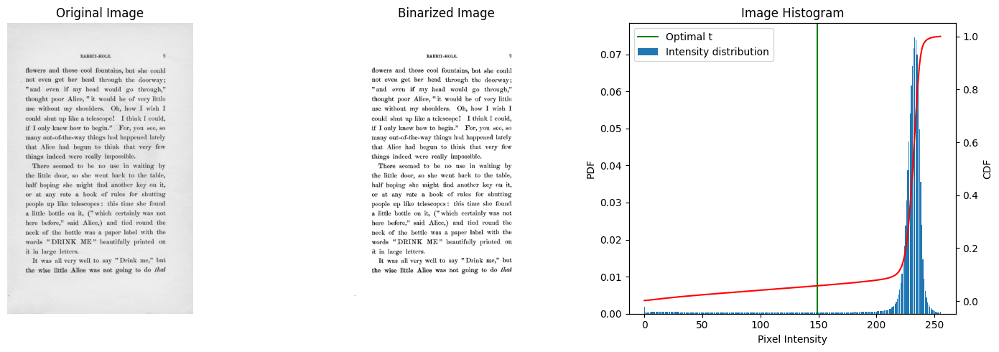

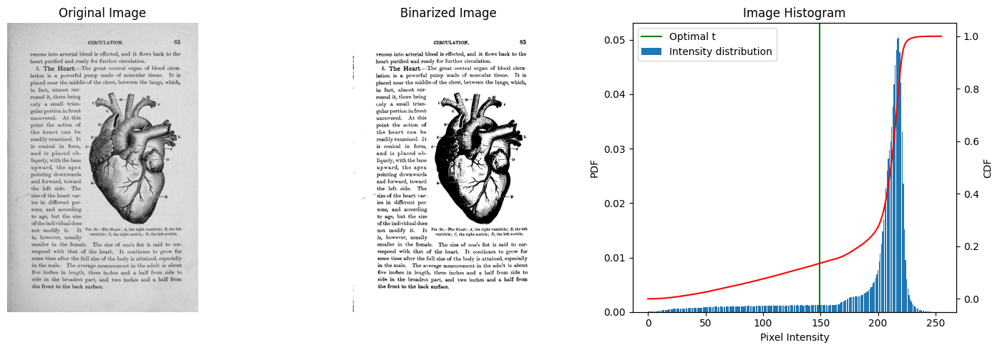

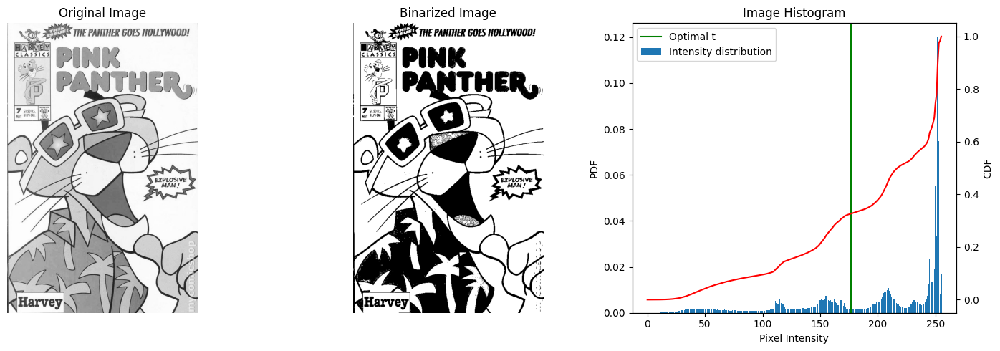

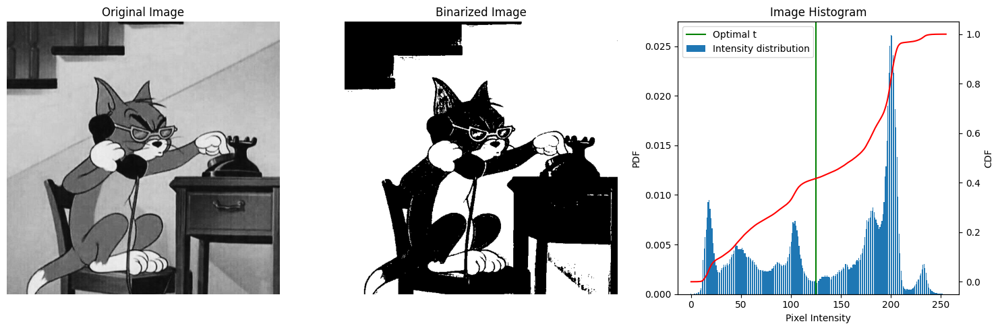

In [ ]:
output.no_vertical_scroll()

inter_class_image1 = BinarizeImage(img1, InterClassOptT(histogram1), display_image_and_histogram=True)
inter_class_image2 = BinarizeImage(img2, InterClassOptT(histogram2), display_image_and_histogram=True)
inter_class_image3 = BinarizeImage(img3, InterClassOptT(histogram3), display_image_and_histogram=True)
inter_class_image4 = BinarizeImage(img4, InterClassOptT(histogram4), display_image_and_histogram=True)

# DisplayImages([inter_class_image1, inter_class_image2, inter_class_image3, inter_class_image4])
# DisplayImages([img1, img2, img3, img4])

## Otsu's thresholding using intraclass variance.

Here I have implemented the same thresholding algorithm using intraclass variance. In this case we would want the variance of both the class to be minimised to ensure proper separability. Hence we loop through all possible values of $t$ and pick the one such that the intraclass variance is minimised.

The expression for the intraclass variance is:

$$w_1\cdot \sigma^2_1 + w_2\cdot \sigma^2_2$$

Where,

$$w_1 = \sum_{i=0}^{t} p(i)$$

$$w_2 = \sum_{i=t + 1}^{L - 1} p(i)$$

$$\mu_1 = \frac{\sum_{i = 0}^{t} \ i \cdot p(i)}{w_1}$$

$$\mu_2 = \frac{\sum_{i = t + 1}^{L - 1} \ i \cdot p(i)}{w_2}$$

$$\sigma_1^2 = \sum_{i = 0} ^ {t} [i - \mu_1]^2 \frac{P(i)}{w_1}$$

$$\sigma_2^2 = \sum_{i = t + 1} ^ {L - 1} [i - \mu_2]^2 \frac{P(i)}{w_2}$$

In [ ]:
def IntraClassOptT(histogram):
  t_opt = 0
  opt_value = IntraClassVariance(histogram, t_opt)
  last_non_zero = 0
  for i in range(256):
    if histogram[i] != 0:
      last_non_zero = i
  first_non_zero = 0
  for i in range(256):
    if histogram[i] != 0:
      first_non_zero = i
      break
  for i in range(first_non_zero, last_non_zero):
    current = IntraClassVariance(histogram, i)
    if opt_value > current:
      t_opt = i
      opt_value = current

  return t_opt

<IPython.core.display.Javascript object>

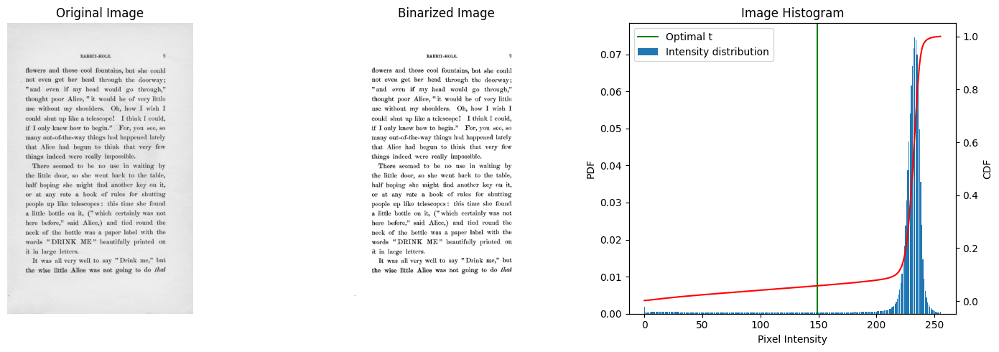

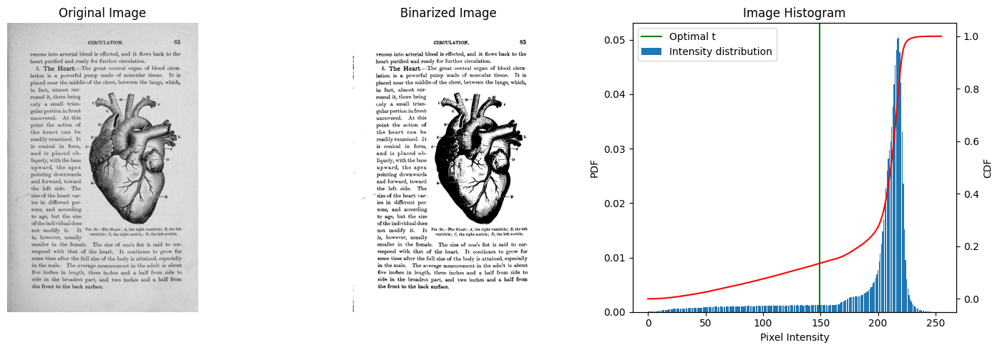

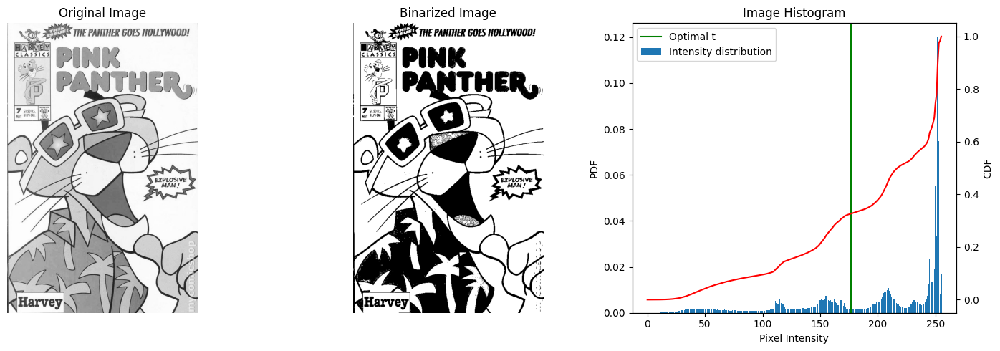

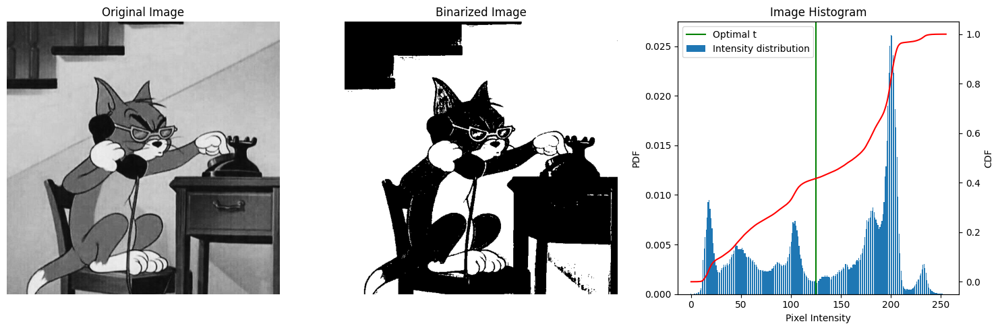

In [ ]:
output.no_vertical_scroll()

intra_class_image1 = BinarizeImage(img1, IntraClassOptT(histogram1), display_image_and_histogram=True)
intra_class_image2 = BinarizeImage(img2, IntraClassOptT(histogram2), display_image_and_histogram=True)
intra_class_image3 = BinarizeImage(img3, IntraClassOptT(histogram3), display_image_and_histogram=True)
intra_class_image4 = BinarizeImage(img4, IntraClassOptT(histogram4), display_image_and_histogram=True)

## Adding Gaussian noise to the images

In this section, I add gaussian noise to each of the images and then I perform the same Otsu's thresholding algorithm and observe the results.

In [ ]:
def AddGaussianNoise(image, mu=0, sigma=1, display_image=False):
  new_image = np.zeros_like(image)
  noise = np.zeros_like(image)

  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      noise[i, j] = random.gauss(mu, sigma)

  new_image = np.clip(image + noise, 0, 255).astype('uint8')

  if display_image:
    DisplayImages([image, noise + 128, new_image], ['Original Image', "Noise", "Noised Image"])

  return new_image

### Example of a noised image

Here I just add noise to the first image and display it to see how the noised image looks like

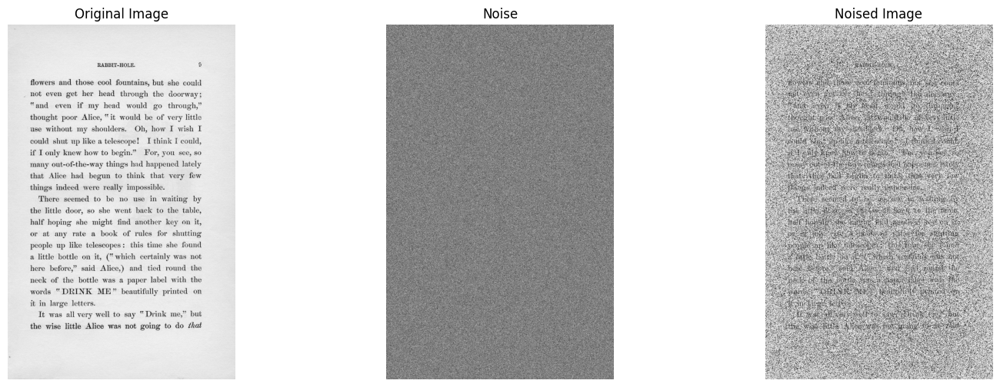

In [ ]:
noised_image = AddGaussianNoise(img1, sigma=30, display_image=True)

### Adding noise to the input images

<IPython.core.display.Javascript object>

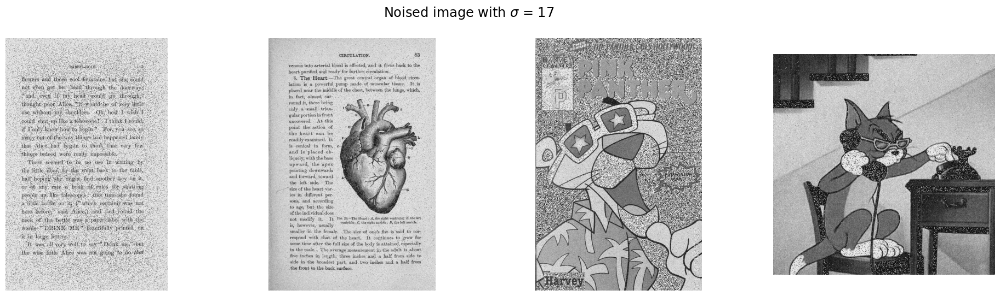

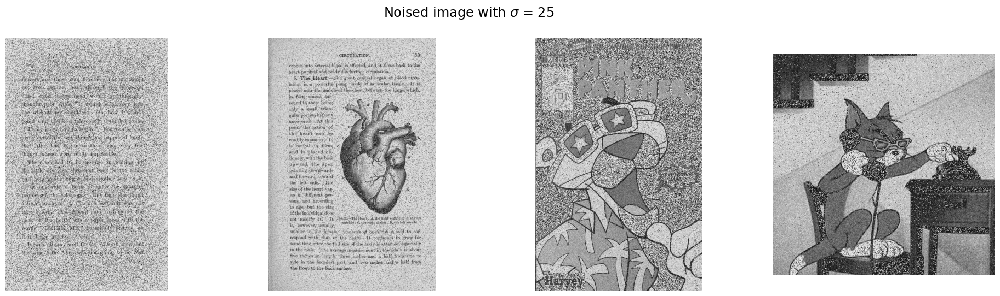

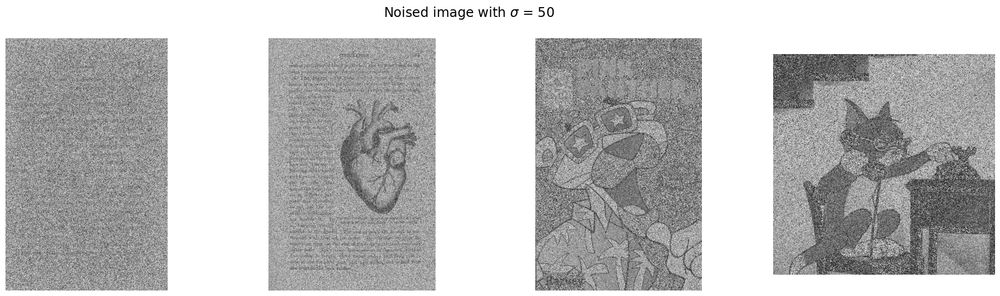

In [ ]:
output.no_vertical_scroll()

sigma1 = 17
sigma2 = 25
sigma3 = 50

noised_image11 = AddGaussianNoise(img1, sigma=sigma1)
noised_image12 = AddGaussianNoise(img2, sigma=sigma1)
noised_image13 = AddGaussianNoise(img3, sigma=sigma1)
noised_image14 = AddGaussianNoise(img4, sigma=sigma1)

noised_image21 = AddGaussianNoise(img1, sigma=sigma2)
noised_image22 = AddGaussianNoise(img2, sigma=sigma2)
noised_image23 = AddGaussianNoise(img3, sigma=sigma2)
noised_image24 = AddGaussianNoise(img4, sigma=sigma2)

noised_image31 = AddGaussianNoise(img1, sigma=sigma3)
noised_image32 = AddGaussianNoise(img2, sigma=sigma3)
noised_image33 = AddGaussianNoise(img3, sigma=sigma3)
noised_image34 = AddGaussianNoise(img4, sigma=sigma3)

DisplayImages([noised_image11, noised_image12, noised_image13, noised_image14], title=f'Noised image with $\sigma$ = {sigma1}')
DisplayImages([noised_image21, noised_image22, noised_image23, noised_image24], title=f'Noised image with $\sigma$ = {sigma2}')
DisplayImages([noised_image31, noised_image32, noised_image33, noised_image34], title=f'Noised image with $\sigma$ = {sigma3}')

### Calculating the histogram for the noised images

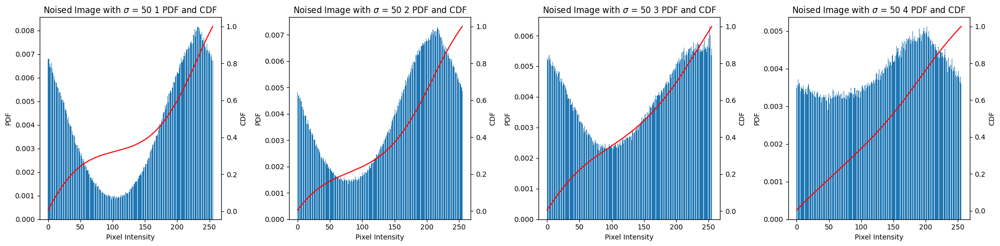

In [ ]:
noised_histogram11 = CalculateHistogram(noised_image11)
noised_histogram12 = CalculateHistogram(noised_image12)
noised_histogram13 = CalculateHistogram(noised_image13)
noised_histogram14 = CalculateHistogram(noised_image14)

noised_histogram21 = CalculateHistogram(noised_image21)
noised_histogram22 = CalculateHistogram(noised_image22)
noised_histogram23 = CalculateHistogram(noised_image23)
noised_histogram24 = CalculateHistogram(noised_image24)

noised_histogram31 = CalculateHistogram(noised_image31)
noised_histogram32 = CalculateHistogram(noised_image32)
noised_histogram33 = CalculateHistogram(noised_image33)
noised_histogram34 = CalculateHistogram(noised_image34)

PlotHistograms([noised_histogram31, noised_histogram32, noised_histogram33, noised_histogram34], [f"Noised Image with $\sigma$ = {sigma3} 1 PDF and CDF", f"Noised Image with $\sigma$ = {sigma3} 2 PDF and CDF", f"Noised Image with $\sigma$ = {sigma3} 3 PDF and CDF", f"Noised Image with $\sigma$ = {sigma3} 4 PDF and CDF"])

### Applying Otsu's thresholding algorithm on the noised images using Interclass variance



<IPython.core.display.Javascript object>

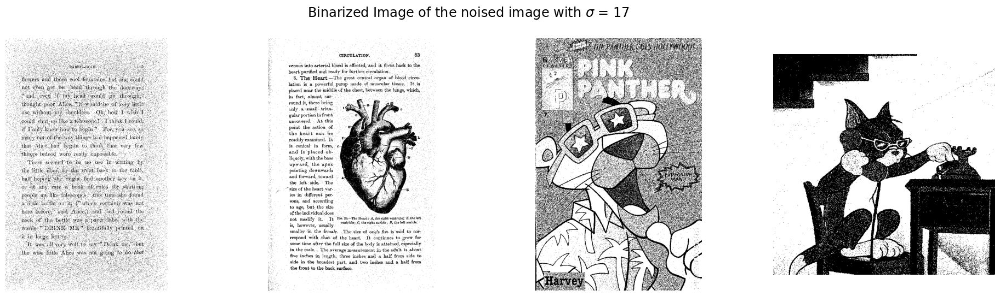

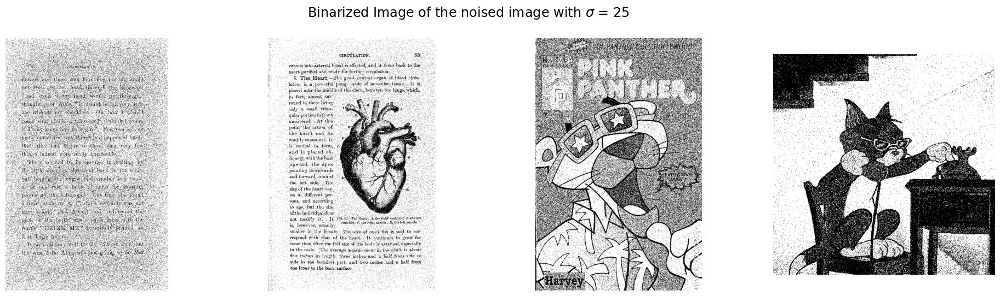

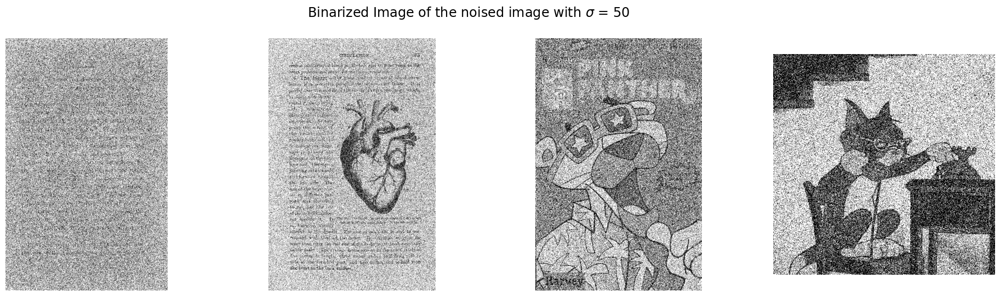

In [ ]:
output.no_vertical_scroll()

inter_class_noised_image11 = BinarizeImage(noised_image11, InterClassOptT(noised_histogram11))
inter_class_noised_image12 = BinarizeImage(noised_image12, InterClassOptT(noised_histogram12))
inter_class_noised_image13 = BinarizeImage(noised_image13, InterClassOptT(noised_histogram13))
inter_class_noised_image14 = BinarizeImage(noised_image14, InterClassOptT(noised_histogram14))

inter_class_noised_image21 = BinarizeImage(noised_image21, InterClassOptT(noised_histogram21))
inter_class_noised_image22 = BinarizeImage(noised_image22, InterClassOptT(noised_histogram22))
inter_class_noised_image23 = BinarizeImage(noised_image23, InterClassOptT(noised_histogram23))
inter_class_noised_image24 = BinarizeImage(noised_image24, InterClassOptT(noised_histogram24))

inter_class_noised_image31 = BinarizeImage(noised_image31, InterClassOptT(noised_histogram31))
inter_class_noised_image32 = BinarizeImage(noised_image32, InterClassOptT(noised_histogram32))
inter_class_noised_image33 = BinarizeImage(noised_image33, InterClassOptT(noised_histogram33))
inter_class_noised_image34 = BinarizeImage(noised_image34, InterClassOptT(noised_histogram34))

DisplayImages([inter_class_noised_image11, inter_class_noised_image12, inter_class_noised_image13, inter_class_noised_image14], title=f'Binarized Image of the noised image with $\sigma$ = {sigma1}')
DisplayImages([inter_class_noised_image21, inter_class_noised_image22, inter_class_noised_image23, inter_class_noised_image24], title=f'Binarized Image of the noised image with $\sigma$ = {sigma2}')
DisplayImages([inter_class_noised_image31, inter_class_noised_image32, inter_class_noised_image33, inter_class_noised_image34], title=f'Binarized Image of the noised image with $\sigma$ = {sigma3}')

### Applying Otsu's thresholding algorithm on the noised images using Intraclass variance



<IPython.core.display.Javascript object>

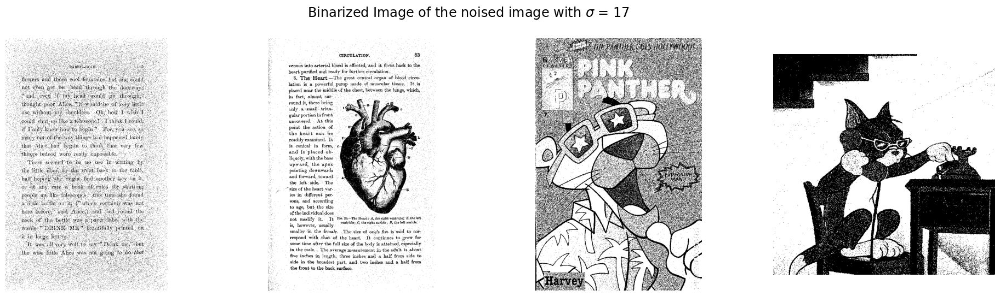

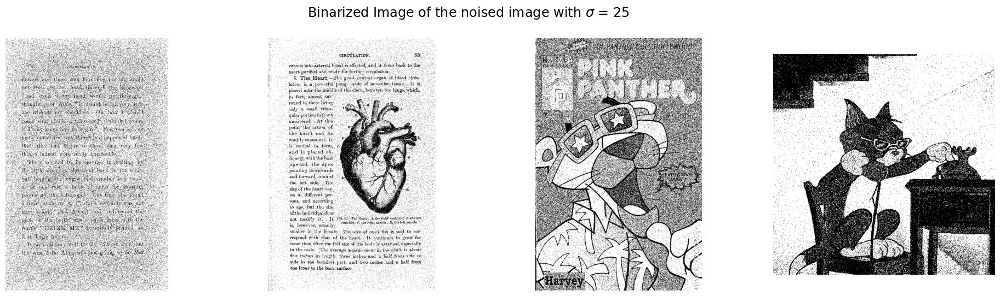

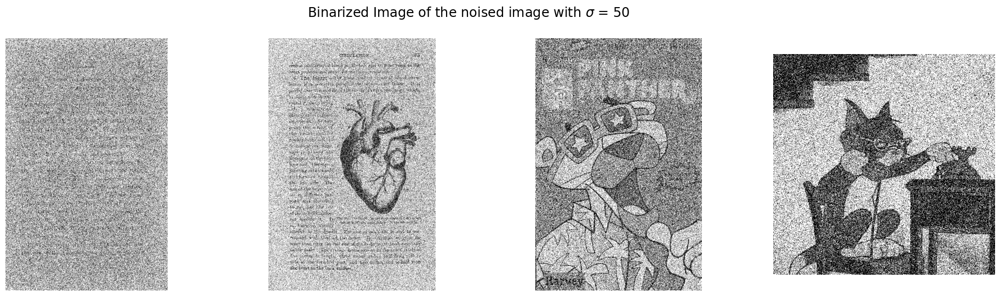

In [ ]:
output.no_vertical_scroll()

intra_class_noised_image11 = BinarizeImage(noised_image11, IntraClassOptT(noised_histogram11))
intra_class_noised_image12 = BinarizeImage(noised_image12, IntraClassOptT(noised_histogram12))
intra_class_noised_image13 = BinarizeImage(noised_image13, IntraClassOptT(noised_histogram13))
intra_class_noised_image14 = BinarizeImage(noised_image14, IntraClassOptT(noised_histogram14))

intra_class_noised_image21 = BinarizeImage(noised_image21, IntraClassOptT(noised_histogram21))
intra_class_noised_image22 = BinarizeImage(noised_image22, IntraClassOptT(noised_histogram22))
intra_class_noised_image23 = BinarizeImage(noised_image23, IntraClassOptT(noised_histogram23))
intra_class_noised_image24 = BinarizeImage(noised_image24, IntraClassOptT(noised_histogram24))

intra_class_noised_image31 = BinarizeImage(noised_image31, IntraClassOptT(noised_histogram31))
intra_class_noised_image32 = BinarizeImage(noised_image32, IntraClassOptT(noised_histogram32))
intra_class_noised_image33 = BinarizeImage(noised_image33, IntraClassOptT(noised_histogram33))
intra_class_noised_image34 = BinarizeImage(noised_image34, IntraClassOptT(noised_histogram34))

DisplayImages([intra_class_noised_image11, intra_class_noised_image12, intra_class_noised_image13, intra_class_noised_image14], title=f'Binarized Image of the noised image with $\sigma$ = {sigma1}')
DisplayImages([intra_class_noised_image21, intra_class_noised_image22, intra_class_noised_image23, intra_class_noised_image24], title=f'Binarized Image of the noised image with $\sigma$ = {sigma2}')
DisplayImages([intra_class_noised_image31, intra_class_noised_image32, intra_class_noised_image33, intra_class_noised_image34], title=f'Binarized Image of the noised image with $\sigma$ = {sigma3}')

### Observations

In the noised image we can see that on adding noise we can see some of the features that wouldn't be visible in the original binarized image. Also for small values of sigma, the algorithm also removes most of noise.

## Saving the images

In [ ]:
SaveImage(inter_class_image1, "inter_class_image1.png")
SaveImage(inter_class_image2, "inter_class_image2.png")
SaveImage(inter_class_image3, "inter_class_image3.png")
SaveImage(inter_class_image4, "inter_class_image4.png")

SaveImage(intra_class_image1, "intra_class_image1.png")
SaveImage(intra_class_image2, "intra_class_image2.png")
SaveImage(intra_class_image3, "intra_class_image3.png")
SaveImage(intra_class_image4, "intra_class_image4.png")

SaveImage(noised_image11, "noised_image11.png")
SaveImage(noised_image12, "noised_image12.png")
SaveImage(noised_image13, "noised_image13.png")
SaveImage(noised_image14, "noised_image14.png")

SaveImage(noised_image21, "noised_image21.png")
SaveImage(noised_image22, "noised_image22.png")
SaveImage(noised_image23, "noised_image23.png")
SaveImage(noised_image24, "noised_image24.png")

SaveImage(noised_image31, "noised_image31.png")
SaveImage(noised_image32, "noised_image32.png")
SaveImage(noised_image33, "noised_image33.png")
SaveImage(noised_image34, "noised_image34.png")

SaveImage(inter_class_noised_image11, "inter_class_noised_image11.png")
SaveImage(inter_class_noised_image12, "inter_class_noised_image12.png")
SaveImage(inter_class_noised_image13, "inter_class_noised_image13.png")
SaveImage(inter_class_noised_image14, "inter_class_noised_image14.png")

SaveImage(inter_class_noised_image21, "inter_class_noised_image21.png")
SaveImage(inter_class_noised_image22, "inter_class_noised_image22.png")
SaveImage(inter_class_noised_image23, "inter_class_noised_image23.png")
SaveImage(inter_class_noised_image24, "inter_class_noised_image24.png")

SaveImage(inter_class_noised_image31, "inter_class_noised_image31.png")
SaveImage(inter_class_noised_image32, "inter_class_noised_image32.png")
SaveImage(inter_class_noised_image33, "inter_class_noised_image33.png")
SaveImage(inter_class_noised_image34, "inter_class_noised_image34.png")

SaveImage(intra_class_noised_image11, "intra_class_noised_image11.png")
SaveImage(intra_class_noised_image12, "intra_class_noised_image12.png")
SaveImage(intra_class_noised_image13, "intra_class_noised_image13.png")
SaveImage(intra_class_noised_image14, "intra_class_noised_image14.png")

SaveImage(intra_class_noised_image21, "intra_class_noised_image21.png")
SaveImage(intra_class_noised_image22, "intra_class_noised_image22.png")
SaveImage(intra_class_noised_image23, "intra_class_noised_image23.png")
SaveImage(intra_class_noised_image24, "intra_class_noised_image24.png")

SaveImage(intra_class_noised_image31, "intra_class_noised_image31.png")
SaveImage(intra_class_noised_image32, "intra_class_noised_image32.png")
SaveImage(intra_class_noised_image33, "intra_class_noised_image33.png")
SaveImage(intra_class_noised_image34, "intra_class_noised_image34.png")

## References

1. Wikipedia Contributors, “Otsu's method,” _Wikipedia_, Aug. 16, 2020. https://en.wikipedia.org/wiki/Otsu%27s_method
2. OpenCV, “OpenCV: Image Thresholding,” _docs.opencv.org_. https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html
3. “Otsu's Thresholding Technique | Learn OpenCV,” Aug. 05, 2020. https://learnopencv.com/otsu-thresholding-with-opencv/
4. “Google Colaboratory: Is there any way to expand the height of the result cell of running a code?,” _Stack Overflow_. https://stackoverflow.com/questions/55546869/google-colaboratory-is-there-any-way-to-expand-the-height-of-the-result-cell-of (accessed Mar. 02, 2024).
